### Notebook for of identified fetal stem cells populations with LGR5- stem cells from Haber, 2017 dataset

- **Developed by:** Anna Maguza
- **Place:** Wuerzburg Institute for System Immunology
- **Created date:** 19th August 2024
- **Last modified date:** 9th September 2024

#### Import required modules

In [1]:
import gdown
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import scarches as sca
import matplotlib.pyplot as plt

/home/amaguza/miniforge3/envs/expimap/lib/python3.10/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/amaguza/miniforge3/envs/expimap/lib/python3.10/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
 captum (see https://github.com/pytorch/captum).


In [2]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

#### Set up working environment

In [3]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.5.post1
scanpy      1.9.8
-----
PIL                         10.2.0
absl                        NA
aiohttp                     3.9.3
aiosignal                   1.3.1
annotated_types             0.6.0
anyio                       NA
array_api_compat            1.4.1
arrow                       1.3.0
asttokens                   NA
async_timeout               4.0.3
attr                        23.2.0
attrs                       23.2.0
babel                       2.14.0
backoff                     2.2.1
bs4                         4.12.3
certifi                     2024.02.02
cffi                        1.16.0
charset_normalizer          3.3.2
chex                        0.1.7
click                       8.1.7
comm                        0.2.1
contextlib2                 NA
croniter                    NA
cycler                      0.12.1
cython_runtime              NA
dateutil                    2.9.0
debugpy                     1.8.1
decorator                   5.1.1

In [4]:
warnings.simplefilter(action = 'ignore')
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

In [5]:
torch.cuda.is_available()

True

#### Read in data

In [6]:
human_adata = sc.read_h5ad("data/Fetal_stem_cells_leiden.h5ad")

In [7]:
mouse_adata = sc.read_h5ad("data/Haber_2017_Smartseq_stem_cells_remapped.h5ad")

#### Create common set of genes

In [8]:
orthologues = pd.read_csv("data/saturn_results/macrogenes_derived_human_mouse_orthologues_10K.csv")

In [9]:
len(set(orthologues['Top Human Gene']).intersection(set(human_adata.var.index)))

6798

In [10]:
len(set(orthologues['Top Mouse Gene']).intersection(set(mouse_adata.var.index)))

6619

In [11]:
human_adata = human_adata[:, orthologues['Top Human Gene']]

In [12]:
human_adata.var.index.duplicated().sum()

3202

In [13]:
human_adata = human_adata[:, ~human_adata.var_names.duplicated()].copy()

+ remove dublicated genes from mouse dataset, leave genes that are expressed in more cells

In [14]:
mouse_adata.var.index.duplicated().sum()

175

In [15]:
mouse_adata = mouse_adata[:, ~mouse_adata.var_names.isin(['nan'])].copy()

In [16]:
mouse_adata = mouse_adata[:, ~mouse_adata.var_names.duplicated()].copy()

In [17]:
mouse_adata = mouse_adata[:, orthologues['Top Mouse Gene']]

In [18]:
mouse_adata.var['gene_name'] = mouse_adata.var.index

In [19]:
orthologues['Top Mouse Gene'].duplicated().sum()

3381

In [20]:
orthologues = orthologues[~orthologues['Top Mouse Gene'].duplicated()]

In [21]:
mouse_adata.var = mouse_adata.var.merge(orthologues, left_on = 'gene_name', right_on = 'Top Mouse Gene', how = 'left')

In [22]:
mouse_adata.var.index = mouse_adata.var['Top Human Gene']

In [23]:
mouse_adata.var.index.duplicated().sum()

5078

In [24]:
mouse_adata = mouse_adata[:, ~mouse_adata.var_names.duplicated()].copy()

In [25]:
common_genes = set(human_adata.var.index).intersection(set(mouse_adata.var.index))

human_adata = human_adata[:, human_adata.var.index.isin(common_genes)].copy()
mouse_adata = mouse_adata[:, mouse_adata.var.index.isin(common_genes)].copy()

+ Prepare obs

In [26]:
mouse_adata.obs['Library_Preparation_Protocol'] = 'Smart-seq2'
mouse_adata.obs['Sample_ID'] = mouse_adata.obs['Sample']
mouse_adata.obs['Study_name'] = 'Haber, 2017'


+ Extract LGR5+ cells

In [27]:
mouse_adata = mouse_adata[mouse_adata.obs['cell_type']=='LGR5- stem cell']

In [28]:
mouse_adata

View of AnnData object with n_obs × n_vars = 68 × 4922
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'full_cell_description', 'cell_type', 'Sample', 'n_genes', 'n_counts', 'Library_Preparation_Protocol', 'Sample_ID', 'Study_name'
    var: 'ensemble_gene_id_version', 'ensemble_gene_id', 'start_position', 'end_position', 'chromosome_name', 'external_gene_name', 'n_counts', 'n_cells', 'gene_name', 'Macrogene', 'Top Human Gene', 'Top Mouse Gene'

### Read the Reactome annotations

In [29]:
reactome_link = 'database_data/reactome.gmt'

### Prepare reference data with ReactomeDB pathways

In [30]:
sca.utils.add_annotations(mouse_adata, reactome_link, min_genes = 12, clean = True)

- Remove all genes that are present in the data but absent in ReactomeDB

In [31]:
mouse_adata._inplace_subset_var(mouse_adata.varm['I'].sum(1)>0)

- Filter out all annotations (terms) with less than 12 genes.

In [32]:
select_terms = mouse_adata.varm['I'].sum(0)>12
mouse_adata.uns['terms'] = np.array(mouse_adata.uns['terms'])[select_terms].tolist()
mouse_adata.varm['I'] = mouse_adata.varm['I'][:, select_terms]

- Filter out genes not present in any of the terms after selection of HVGs.

In [33]:
mouse_adata._inplace_subset_var(mouse_adata.varm['I'].sum(1)>0)

### Create expiMap model and train it on reference dataset

In [34]:
mouse_adata.X = mouse_adata.X.astype(np.float32)

In [35]:
intr_cvae = sca.models.EXPIMAP(
    adata = mouse_adata,
    condition_key = 'cell_type',
    hidden_layer_sizes = [256, 256, 256],
    recon_loss = 'nb'
)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1521 256 1
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 202
Decoder Architecture:
	Masked linear layer in, ext_m, ext, cond, out:  202 0 0 1 1521
	with hard mask.
Last Decoder layer: softmax


In [36]:
ALPHA = 0.7

In [37]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_unweighted_loss", # val_unweighted_loss
    "threshold": 0,
    "patience": 50,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}
intr_cvae.train(
    n_epochs = 400,
    alpha_epoch_anneal = 100,
    alpha = ALPHA,
    alpha_kl = 0.5,
    weight_decay = 0.,
    early_stopping_kwargs = early_stopping_kwargs,
    use_early_stopping = True,
    monitor_only_val = False,
    seed = 1712,
    accelerator = "gpu",
    devices = [0]
)

Preparing (68, 1521)
Instantiating dataset
Init the group lasso proximal operator for the main terms.
 |█-------------------| 8.2%  - epoch_loss: 8826.0957031250 - epoch_recon_loss: 8658.9414062500 - epoch_kl_loss: 1044.7135009766 - val_loss: 7776.7016601562 - val_recon_loss: 7602.8613281250 - val_kl_loss: 1086.5024414062

 |█████████████-------| 65.5%  - epoch_loss: 6340.8398437500 - epoch_recon_loss: 5884.4301757812 - epoch_kl_loss: 912.8197631836 - val_loss: 5805.9990234375 - val_recon_loss: 5341.2275390625 - val_kl_loss: 929.543212890687
ADJUSTED LR
 |██████████████------| 71.5%  - epoch_loss: 6346.7070312500 - epoch_recon_loss: 5869.4746093750 - epoch_kl_loss: 954.4645996094 - val_loss: 5804.3310546875 - val_recon_loss: 5347.0834960938 - val_kl_loss: 914.4951171875
ADJUSTED LR
 |██████████████------| 74.8%  - epoch_loss: 6119.2651367188 - epoch_recon_loss: 5672.8408203125 - epoch_kl_loss: 892.8488769531 - val_loss: 5786.9487304688 - val_recon_loss: 5335.8881835938 - val_kl_loss: 902.1214599609
ADJUSTED LR
 |███████████████-----| 78.0%  - epoch_loss: 6257.2246093750 - epoch_recon_loss: 5792.0937500000 - epoch_kl_loss: 930.2613525391 - val_loss: 5795.1572265625 - val_recon_loss: 5344.6552734375 - val_kl_loss: 901.0041503906
ADJUSTED LR
 |████████████████----| 80.8%  - epoch_loss: 6550.0493164062 - epo

In [38]:
MEAN = False

In [39]:
mouse_adata.obsm['X_cvae'] = intr_cvae.get_latent(mean = MEAN, only_active = True)

+ Extract meaningful latent directions

In [40]:
intr_cvae.latent_directions(adata=mouse_adata)

### Initlizling the model for query training

### MTRNR2L12+ASS1+_SC

+ Prepare query dataset

In [41]:
human_adata_copy = human_adata.copy()

In [42]:
human_adata = human_adata[human_adata.obs['cell_type']=='MTRNR2L12+ASS1+_SC'].copy()

In [43]:
human_adata = human_adata[:, mouse_adata.var_names]

+ Add terms to query dataset

In [44]:
human_adata.uns['terms'] = mouse_adata.uns['terms']

+ Train the model

In [45]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(human_adata, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 3979 × 1521
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'leiden', 'cluster', 'cell_type'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0', 'n_counts', 'n_cells'
    uns: 'Age_colors', 'Age_group_colors', 'Donor_ID_colors', 'Library_Preparation_Protocol_colors', 'Sex_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITI

In [46]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (3979, 1521)
Instantiating dataset
 |██████--------------| 32.8%  - val_loss: 737.6150054932 - val_recon_loss: 713.3610076904 - val_kl_loss: 242.54000091550
ADJUSTED LR
 |██████--------------| 34.5%  - val_loss: 744.5312194824 - val_recon_loss: 720.2587585449 - val_kl_loss: 242.7246818542
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 116


### Get latent representation of reference + query dataset

In [47]:
adata_joined = sc.AnnData.concatenate(mouse_adata, human_adata, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 4047 × 1521
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'full_cell_description', 'cell_type', 'Sample', 'n_genes', 'n_counts', 'Library_Preparation_Protocol', 'Sample_ID', 'Study_name', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'leiden', 'cluster', 'batch_join'
    var: 'ensemble_gene_id_version-0', 'ensemble_gene_id-0', 'start_position-0', 'end_position-0', 'chromosome_name-0', 'external_gene_name-0', 'n_counts-0', 'n_cells-0', 'gene_name-0', 'Macrogene-0', 'Top Human Gene-0', 'Top Mouse Gene-0', 'n_counts-1', 'n_cells-1', 'feature_types-0-0-0-1', 'gene_name-1-0-0-1', 'gene_id-0-0-1', 'GENE-1-0-1'
    uns: 'terms'

+ Get latent representation for the concatenated dataset

In [48]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['cell_type'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [49]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


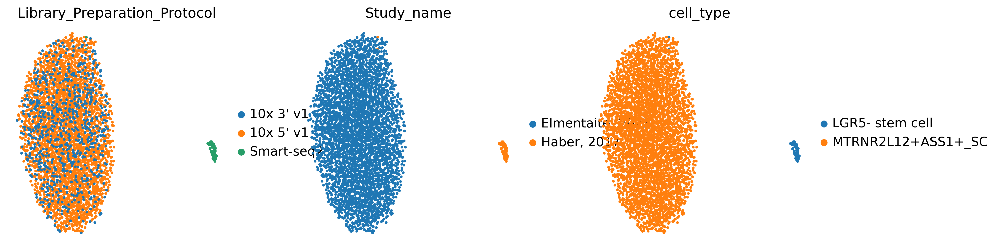

In [50]:
sc.pl.umap(adata_joined, color=['Library_Preparation_Protocol', 'Study_name', 'cell_type'], frameon=False)

+ Extract meaningful latent directions

In [51]:
q_intr_cvae.latent_directions(adata=adata_joined)

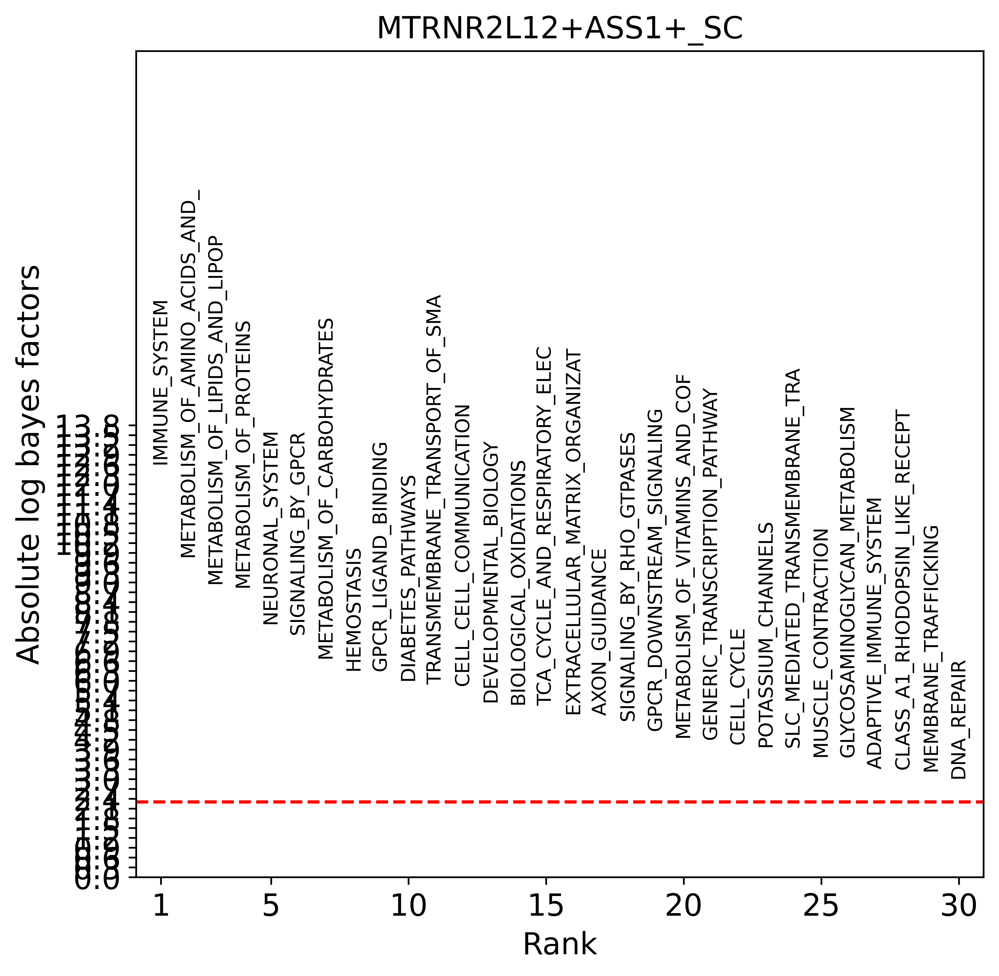

In [52]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'cell_type', comparison = 'LGR5- stem cell', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

+ Extract gene programs and absolute log bayes factors in the dataframe 

In [53]:
scores = adata_joined.uns['bf_scores']
terms = adata_joined.uns['terms']

all_programs = []

for key in scores.keys():
    bfs = np.abs(scores[key]['bf'])
    for bf, term in zip(bfs, terms):
        all_programs.append({
            'Comparison': key,
            'Gene Program': term,
            'Absolute Log Bayes Factor': bf
        })

df_gene_programs = pd.DataFrame(all_programs)
df_gene_programs = df_gene_programs.sort_values('Absolute Log Bayes Factor', ascending=False)

In [54]:
print(df_gene_programs.head())

             Comparison                    Gene Program  \
180  MTRNR2L12+ASS1+_SC                   IMMUNE_SYSTEM   
54   MTRNR2L12+ASS1+_SC  METABOLISM_OF_AMINO_ACIDS_AND_   
136  MTRNR2L12+ASS1+_SC  METABOLISM_OF_LIPIDS_AND_LIPOP   
85   MTRNR2L12+ASS1+_SC          METABOLISM_OF_PROTEINS   
60   MTRNR2L12+ASS1+_SC                 NEURONAL_SYSTEM   

     Absolute Log Bayes Factor  
180                  12.610177  
54                    9.779014  
136                   8.959394  
85                    8.848893  
60                    7.737961  


In [55]:
df_gene_programs.to_csv('data/expimap_results/LGR5low_vs_MTRNR2L12+ASS1+_SC.csv', index=False)

#### RPS10+_RPS17+_SC

In [56]:
human_adata = human_adata_copy.copy()

In [57]:
human_adata = human_adata[human_adata.obs['cell_type']=='RPS10+_RPS17+_SC'].copy()

In [58]:
human_adata = human_adata[:, mouse_adata.var_names]

+ Add terms to query dataset

In [59]:
human_adata.uns['terms'] = mouse_adata.uns['terms']

+ Train the model

In [60]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(human_adata, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 3544 × 1521
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'leiden', 'cluster', 'cell_type'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0', 'n_counts', 'n_cells'
    uns: 'Age_colors', 'Age_group_colors', 'Donor_ID_colors', 'Library_Preparation_Protocol_colors', 'Sex_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITI

In [61]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (3544, 1521)
Instantiating dataset
 |███████████████-----| 78.8%  - val_loss: 787.5843709310 - val_recon_loss: 769.0442504883 - val_kl_loss: 185.40122477211
ADJUSTED LR
 |██████████████████--| 90.5%  - val_loss: 786.5036214193 - val_recon_loss: 768.0361938477 - val_kl_loss: 184.6743214925
ADJUSTED LR
 |██████████████████--| 92.2%  - val_loss: 786.0143229167 - val_recon_loss: 767.5432739258 - val_kl_loss: 184.7104288737
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 347


### Get latent representation of reference + query dataset

In [62]:
adata_joined = sc.AnnData.concatenate(mouse_adata, human_adata, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 3612 × 1521
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'full_cell_description', 'cell_type', 'Sample', 'n_genes', 'n_counts', 'Library_Preparation_Protocol', 'Sample_ID', 'Study_name', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'leiden', 'cluster', 'batch_join'
    var: 'ensemble_gene_id_version-0', 'ensemble_gene_id-0', 'start_position-0', 'end_position-0', 'chromosome_name-0', 'external_gene_name-0', 'n_counts-0', 'n_cells-0', 'gene_name-0', 'Macrogene-0', 'Top Human Gene-0', 'Top Mouse Gene-0', 'n_counts-1', 'n_cells-1', 'feature_types-0-0-0-1', 'gene_name-1-0-0-1', 'gene_id-0-0-1', 'GENE-1-0-1'
    uns: 'terms'

+ Get latent representation for the concatenated dataset

In [63]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['cell_type'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [64]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


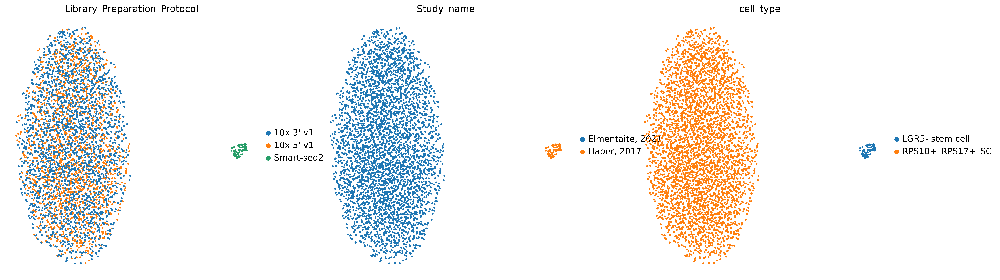

In [65]:
sc.pl.umap(adata_joined, color=['Library_Preparation_Protocol', 'Study_name', 'cell_type'], frameon=False)

+ Extract meaningful latent directions

In [66]:
q_intr_cvae.latent_directions(adata=adata_joined)

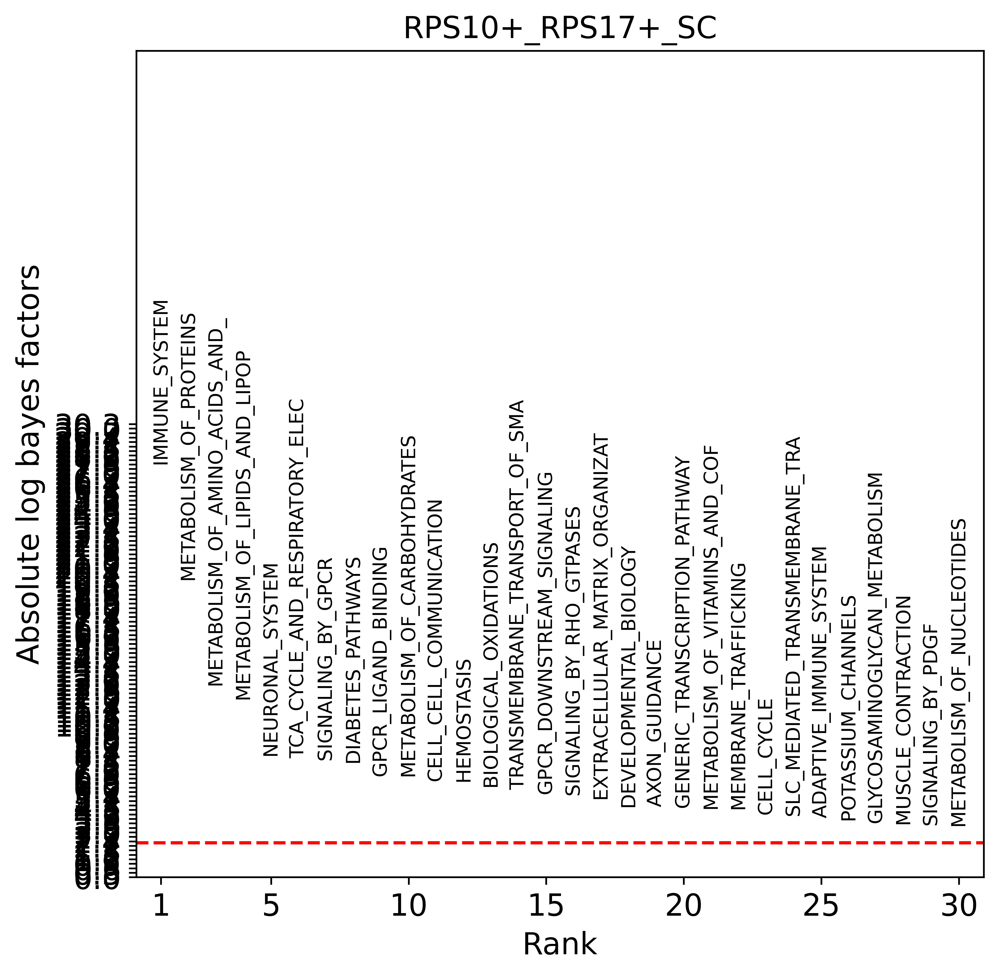

In [67]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'cell_type', comparison = 'LGR5- stem cell', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

+ Extract gene programs and absolute log bayes factors in the dataframe 

In [68]:
scores = adata_joined.uns['bf_scores']
terms = adata_joined.uns['terms']

all_programs = []

for key in scores.keys():
    bfs = np.abs(scores[key]['bf'])
    for bf, term in zip(bfs, terms):
        all_programs.append({
            'Comparison': key,
            'Gene Program': term,
            'Absolute Log Bayes Factor': bf
        })

df_gene_programs = pd.DataFrame(all_programs)
df_gene_programs = df_gene_programs.sort_values('Absolute Log Bayes Factor', ascending=False)

In [69]:
print(df_gene_programs.head())

           Comparison                    Gene Program  \
180  RPS10+_RPS17+_SC                   IMMUNE_SYSTEM   
85   RPS10+_RPS17+_SC          METABOLISM_OF_PROTEINS   
54   RPS10+_RPS17+_SC  METABOLISM_OF_AMINO_ACIDS_AND_   
136  RPS10+_RPS17+_SC  METABOLISM_OF_LIPIDS_AND_LIPOP   
60   RPS10+_RPS17+_SC                 NEURONAL_SYSTEM   

     Absolute Log Bayes Factor  
180                  27.631021  
85                   19.892122  
54                   12.851339  
136                  11.908137  
60                    8.130117  


In [70]:
df_gene_programs.to_csv('data/expimap_results/LGR5low_vs_RPS10+_RPS17+_SC.csv', index=False)

#### FXYD3+_CKB+_SC

In [71]:
human_adata = human_adata_copy.copy()

In [72]:
human_adata = human_adata[human_adata.obs['cell_type']=='FXYD3+_CKB+_SC'].copy()

In [73]:
human_adata = human_adata[:, mouse_adata.var_names]

+ Add terms to query dataset

In [74]:
human_adata.uns['terms'] = mouse_adata.uns['terms']

+ Train the model

In [75]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(human_adata, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 294 × 1521
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'leiden', 'cluster', 'cell_type'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0', 'n_counts', 'n_cells'
    uns: 'Age_colors', 'Age_group_colors', 'Donor_ID_colors', 'Library_Preparation_Protocol_colors', 'Sex_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITIA

In [76]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (294, 1521)
Instantiating dataset
 |████████████████████| 100.0%  - val_loss: 1004.3186645508 - val_recon_loss: 962.4252319336 - val_kl_loss: 418.9345703125
Saving best state of network...
Best State was in Epoch 399


### Get latent representation of reference + query dataset

In [77]:
adata_joined = sc.AnnData.concatenate(mouse_adata, human_adata, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 362 × 1521
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'full_cell_description', 'cell_type', 'Sample', 'n_genes', 'n_counts', 'Library_Preparation_Protocol', 'Sample_ID', 'Study_name', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'leiden', 'cluster', 'batch_join'
    var: 'ensemble_gene_id_version-0', 'ensemble_gene_id-0', 'start_position-0', 'end_position-0', 'chromosome_name-0', 'external_gene_name-0', 'n_counts-0', 'n_cells-0', 'gene_name-0', 'Macrogene-0', 'Top Human Gene-0', 'Top Mouse Gene-0', 'n_counts-1', 'n_cells-1', 'feature_types-0-0-0-1', 'gene_name-1-0-0-1', 'gene_id-0-0-1', 'GENE-1-0-1'
    uns: 'terms'

+ Get latent representation for the concatenated dataset

In [78]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['cell_type'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [79]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


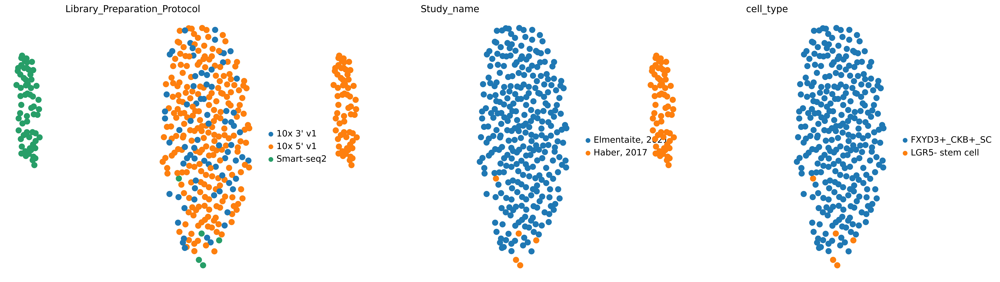

In [80]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
sc.pl.umap(adata_joined, color=['Library_Preparation_Protocol', 'Study_name', 'cell_type'], frameon=False)

+ Extract meaningful latent directions

In [81]:
q_intr_cvae.latent_directions(adata=adata_joined)

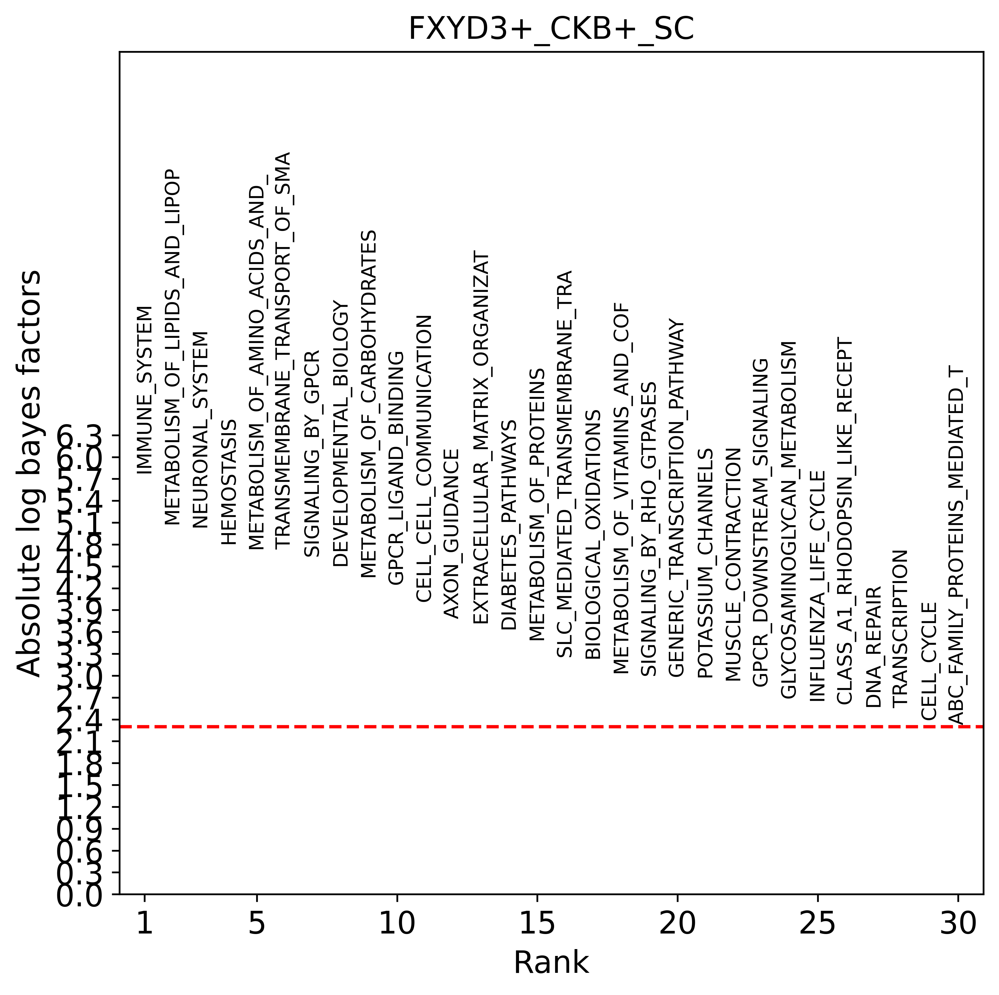

In [82]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'cell_type', comparison = 'LGR5- stem cell', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

+ Extract gene programs and absolute log bayes factors in the dataframe 

In [83]:
scores = adata_joined.uns['bf_scores']
terms = adata_joined.uns['terms']

all_programs = []

for key in scores.keys():
    bfs = np.abs(scores[key]['bf'])
    for bf, term in zip(bfs, terms):
        all_programs.append({
            'Comparison': key,
            'Gene Program': term,
            'Absolute Log Bayes Factor': bf
        })

df_gene_programs = pd.DataFrame(all_programs)
df_gene_programs = df_gene_programs.sort_values('Absolute Log Bayes Factor', ascending=False)

In [84]:
print(df_gene_programs.head())

         Comparison                    Gene Program  Absolute Log Bayes Factor
180  FXYD3+_CKB+_SC                   IMMUNE_SYSTEM                   5.779815
136  FXYD3+_CKB+_SC  METABOLISM_OF_LIPIDS_AND_LIPOP                   5.080046
60   FXYD3+_CKB+_SC                 NEURONAL_SYSTEM                   5.036582
166  FXYD3+_CKB+_SC                      HEMOSTASIS                   4.810912
54   FXYD3+_CKB+_SC  METABOLISM_OF_AMINO_ACIDS_AND_                   4.740334


In [85]:
df_gene_programs.to_csv('data/expimap_results/LGR5low_vs_FXYD3+_CKB+_SC.csv', index=False)